# Shared patterns of ILS across chromosomes

In [1]:
%matplotlib inline

%env http_proxy=http://proxy-default:3128
%env https_proxy=http://proxy-default:3128

import numpy as np
import pandas as pd
from pandas import DataFrame, Series
import warnings
from scipy import signal, stats
from statsmodels.nonparametric.smoothers_lowess import lowess

import sklearn
import numpy as np
from sklearn.preprocessing import quantile_transform

from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

import mpld3

from horizonplot import horizonplot
from chromwindow import window
# import mygene
#from geneinfo import geneinfo, geneplot, connect_mygene
import geneinfo as gi
gi.email('kaspermunch@birc.au.dk')

import seaborn as sns
sns.set()
sns.set_style("ticks")
sns.set_context("notebook")

# scale down size of default plots
import matplotlib as mpl
scale = 0.9
d = dict([(k, v*scale) for (k, v) in sns.plotting_context('paper').items()])
d['figure.figsize'] = [5.4, 3.5]
mpl.rcParams.update(d)

def add_band(x_low, x_high, y_low=None, y_high=None, ax=None, color='gray', linewidth=0, alpha=0.5, zorder=0, **kwargs):
    "Plot a gray block on x interval"
    if ax is None:
        ax = plt.gca()
    if y_low is None:
        y_low, _ = ax.get_ylim()
    if y_high is None:
        _, y_high = ax.get_ylim()
    g = ax.add_patch(Rectangle((x_low, y_low), x_high-x_low, y_high-y_low, 
                 facecolor=color,
                 linewidth=linewidth,
                 alpha=alpha,
                 zorder=zorder,
                 **kwargs))

def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pd.concat([df1, df2]).sort_values([start, end])

# My own paired palette replacing the last brown pair with violets
sns.color_palette('Paired').as_hex()
Paired = sns.color_palette(['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c',
                            '#fdbf6f', '#ff7f00', '#cab2d6','#6a3d9a', '#e585cf', '#ad009d'])
#sns.palplot(Paired)
Infographics = sns.color_palette(['#e8615d', '#f49436', '#2d9de5', '#3bbdbd', '#634792'])
#sns.palplot(Infographics)

chromosomes = list(map(str, range(1,23))) + ['X']

env: http_proxy=http://proxy-default:3128
env: https_proxy=http://proxy-default:3128


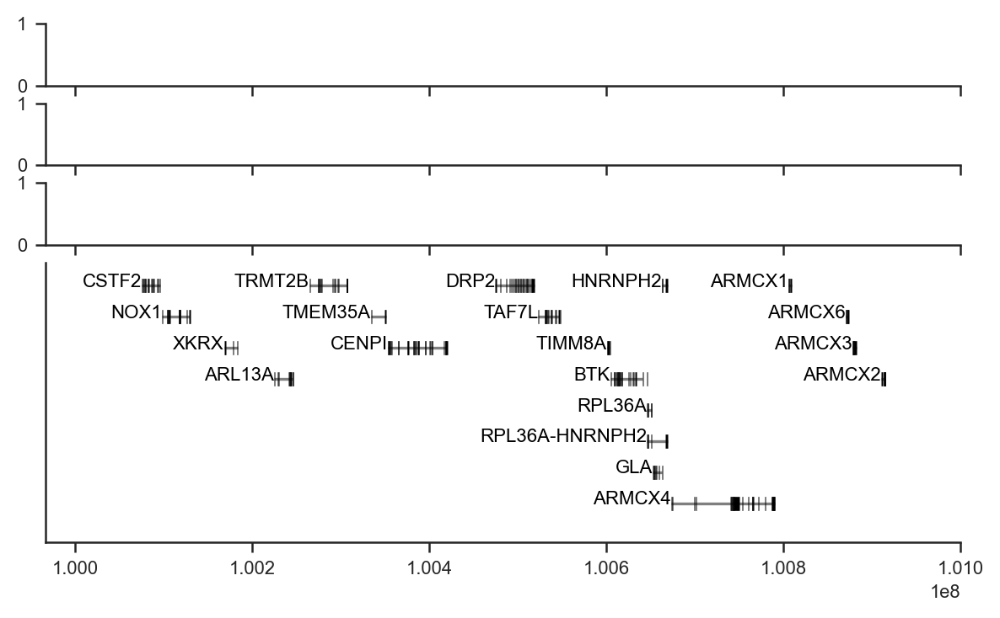

In [12]:
ax = gi.gene_plot('chrX', 100000000, 101000000, assembly='hg19', figsize=(7, 4), return_axes=3)
sns.despine()

In [4]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

## ECH regions

In [5]:
extended_peak_regions_10 = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/extended_peak_regions_5e-05_25%_10%.hdf')
extended_peak_regions_75 = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/extended_peak_regions_5e-05_25%_75%.hdf')
extended_peak_regions_90 = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/extended_peak_regions_5e-05_25%_90%.hdf')
human_chimp_low_ils_regions_chrX = pd.read_hdf('/home/kmt/simons/faststorage/people/kmt/results/human_chimp_low_ils_regions_chrX.hdf')

## Load ILS data

HDF is written in `nb01_horizons.ipynb`:

In [6]:
ils_data = pd.read_hdf('../results/ils_data.h5')
ils_data.head()

,chrom,start,end,analysis,V0,V1,V2,V3,tot_segment,propils,ilsskew,propils_logznorm,propils_logzmodenorm,propils_qnorm,propils_znorm,ilsskew_qnorm,ilsskew_znorm,ilsskew_logznorm,ilsskew_zmodenorm,names
0,1,0,100000,AOTNAN_SAGMID_CEBALB_HOMSAP,15713,6197,9257,4414,35581,0.384222,0.354254,-4.562875,-4.839088,-2.510618,-4.032554,0.371906,0.325882,-0.198956,0.283385,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
1,1,100000,200000,AOTNAN_SAGMID_CEBALB_HOMSAP,27899,8485,21983,14441,72808,0.500275,0.207061,-2.292568,-2.568780,-1.891036,-2.273812,-0.809231,-0.642302,NaN,-0.685014,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
2,1,200000,300000,AOTNAN_SAGMID_CEBALB_HOMSAP,14114,4976,7714,4483,31287,0.389842,0.264901,-4.440396,-4.716609,-2.433407,-3.947377,-0.368784,-0.261849,NaN,-0.304477,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
3,1,300000,400000,AOTNAN_SAGMID_CEBALB_HOMSAP,10287,1161,7339,7719,26506,0.568098,-0.025236,-1.168320,-1.444533,-1.427019,-1.245975,-2.009402,-2.170279,NaN,-2.213330,Aotus_nancymaae Saguinus_midas Cebus_albifrons...
4,1,400000,500000,AOTNAN_SAGMID_CEBALB_HOMSAP,15683,1854,11097,6801,35435,0.505094,0.240027,-2.208442,-2.484655,-1.857263,-2.200779,-0.566879,-0.425465,NaN,-0.468129,Aotus_nancymaae Saguinus_midas Cebus_albifrons...


# Accumulate evidence of ILS proportion and skew across trios

Only use subset of analyses with intermediate amounts of ILS:

In [7]:
global_mean_ils = ils_data.groupby(['analysis', 'names']).propils.mean().sort_values().to_frame().reset_index()

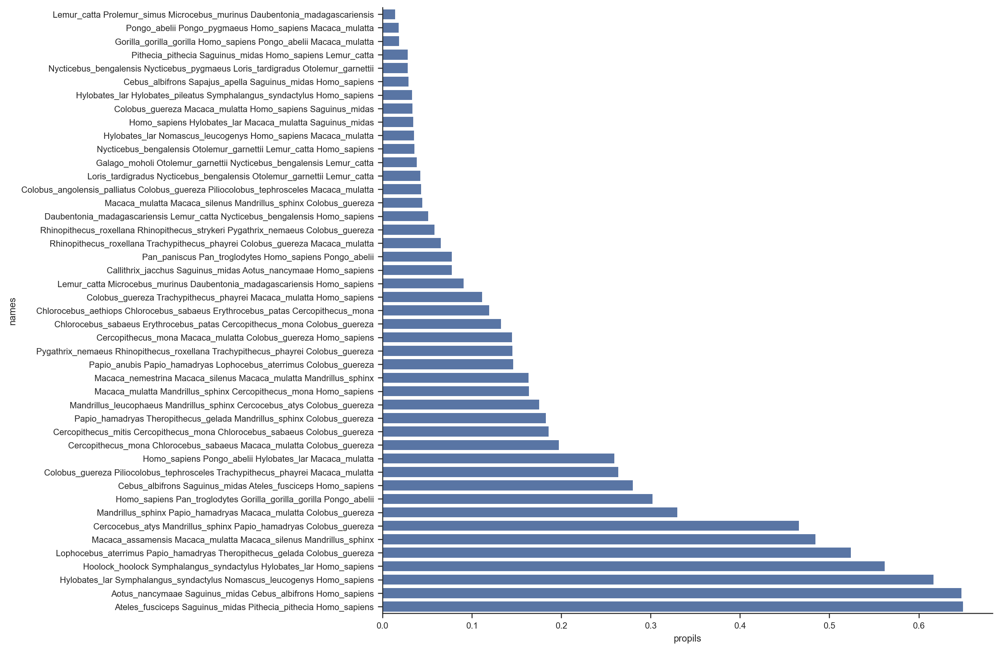

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.barplot(x='propils', y='names', data=global_mean_ils, color='b', ax=ax)
sns.despine()

## Select subset of analyses with intermediate ILS

Only consider a subset of analyses where mean ILS proportion is not close to either zero or 2/3:

In [9]:
analyses_subset = global_mean_ils.loc[(global_mean_ils.propils >= 0.1) & (global_mean_ils.propils <= 0.5), 'analysis']
analyses_subset

21    COLGUE_TRAPHA_MACMUL_HOMSAP
22    CHLAET_CHLSAB_ERYPAT_CERMON
23    CHLSAB_ERYPAT_CERMON_COLGUE
24    CERMON_MACMUL_COLGUE_HOMSAP
25    PYGNEM_RHIROX_TRAPHA_COLGUE
26    PAPANU_PAPHAM_LOPATE_COLGUE
27    MACNEM_MACSIL_MACMUL_MANSPH
28    MACMUL_MANSPH_CERMON_HOMSAP
29    MANLEU_MANSPH_CERATY_COLGUE
30    PAPHAM_THEGEL_MANSPH_COLGUE
31    CERMIT_CERMON_CHLSAB_COLGUE
32    CERMON_CHLSAB_MACMUL_COLGUE
33    HOMSAP_PONABE_HYLLAR_MACMUL
34    COLGUE_PILTEP_TRAPHA_MACMUL
35    CEBALB_SAGMID_ATEFUS_HOMSAP
36    HOMSAP_PANTRO_GORGOR_PONABE
37    MANSPH_PAPHAM_MACMUL_COLGUE
38    CERATY_MANSPH_PAPHAM_COLGUE
39    MACASS_MACMUL_MACSIL_MANSPH
Name: analysis, dtype: object

## Mean proportion of ILS

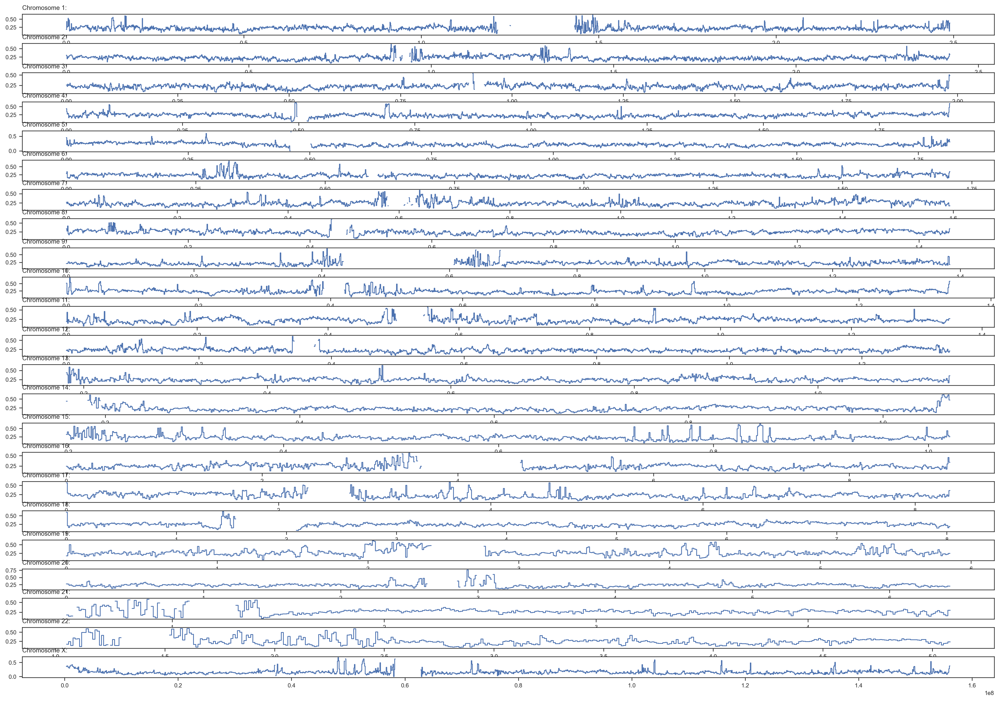

In [10]:
fig, ax = plt.subplots(23, 1, figsize=(16*3/2, 11*3/2))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils
               .agg('mean')
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)  

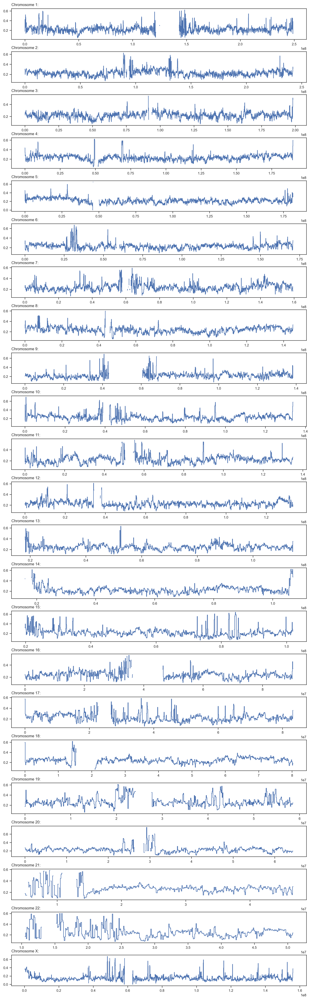

In [15]:
fig, ax = plt.subplots(23, 1, figsize=(12, 40))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils
               .agg('mean')
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

## Mean ILS qnorm

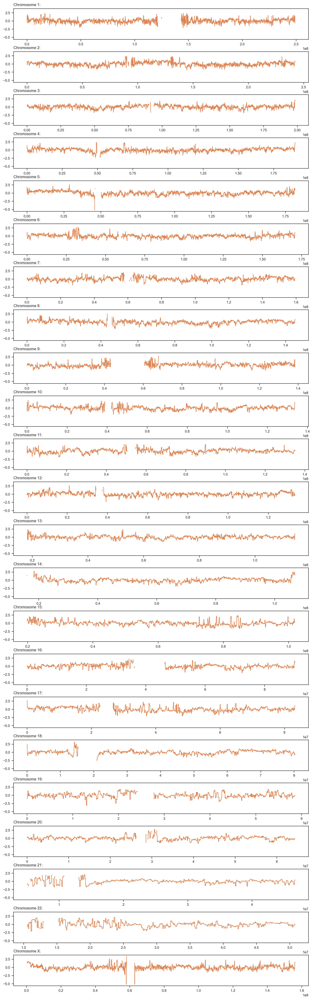

In [14]:
fig, ax = plt.subplots(23, 1, figsize=(12, 40), sharey=True)
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils_qnorm
               .agg('mean')
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils_qnorm, color='C1')
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

## Mean *absolute* ILS z norm

I.e, where is the ILS either high or low

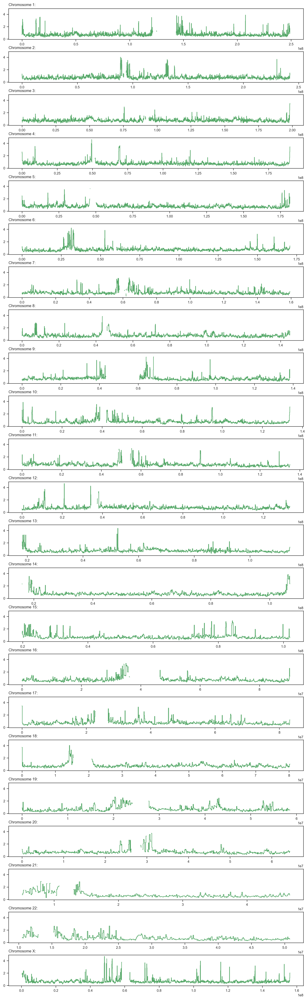

In [11]:
def absmean(sr):
    return np.absolute(sr).mean()

fig, ax = plt.subplots(23, 1, figsize=(12, 40), sharey=True)
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .propils_znorm
               .agg(absmean)
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.propils_znorm, color='C2')
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)  

# maybe add to gene_plot that highlighted genes can have a property that is a thin vertical line that is drawn on the gene plot

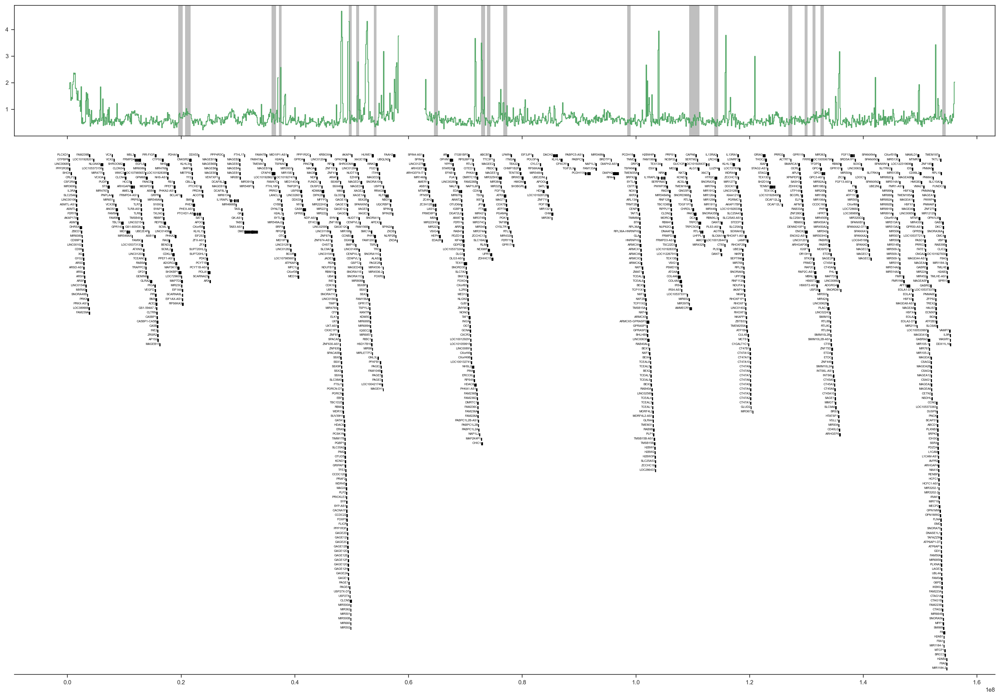

In [23]:
ax = gi.gene_plot('chrX', 0, 160000000, assembly='hg19', figsize=(16*3/2, 11*3/2), aspect=4, gene_density=180, font_size=4)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2')
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

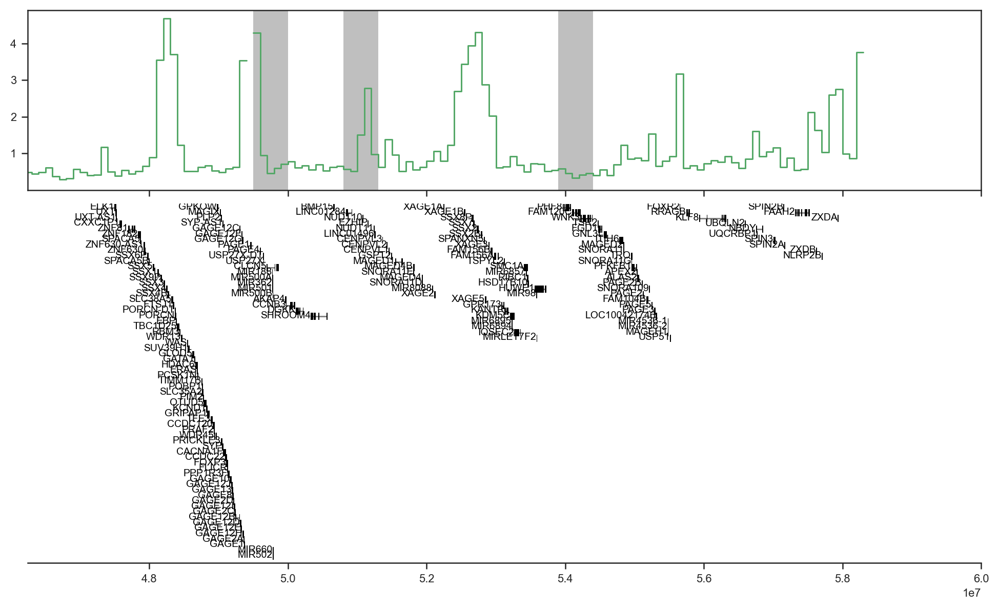

In [21]:
ax = gi.gene_plot('chrX', 47500000, 60000000, assembly='hg19', figsize=(12, 7), aspect=2)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2') ;
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

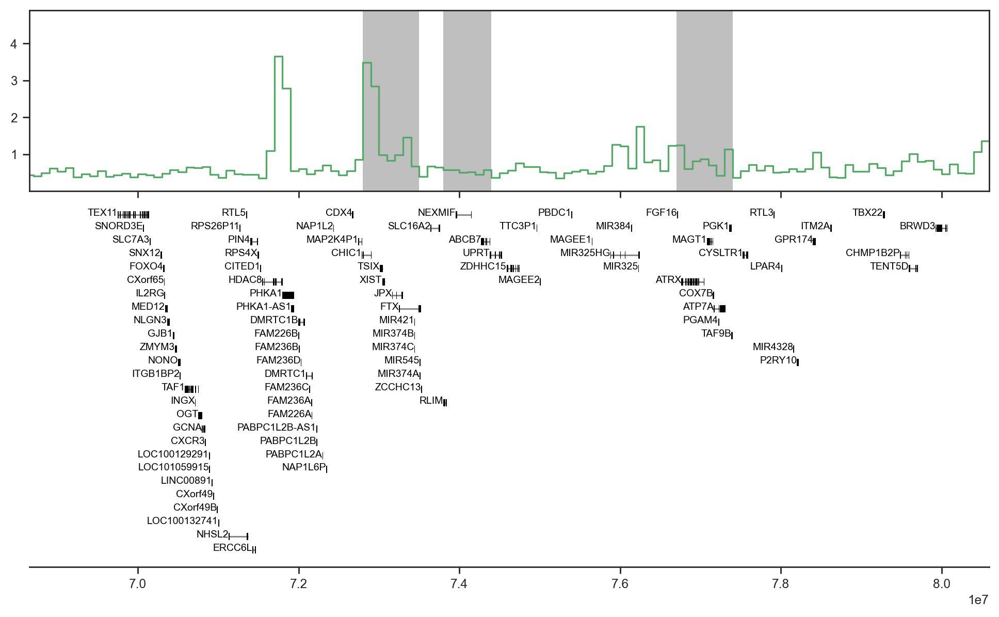

In [56]:
ax = gi.gene_plot('chrX', 70000000, 80000000, assembly='hg19', figsize=(12, 7), aspect=2)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2') ;
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

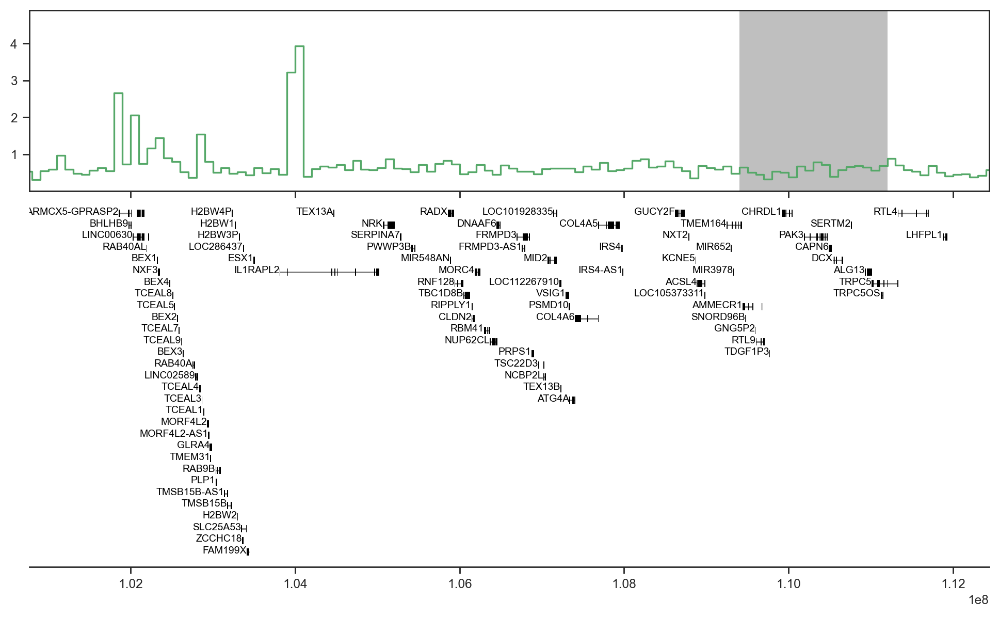

In [58]:
ax = gi.gene_plot('chrX', 102000000, 112000000, assembly='hg19', figsize=(12, 7), aspect=2)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2') ;
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

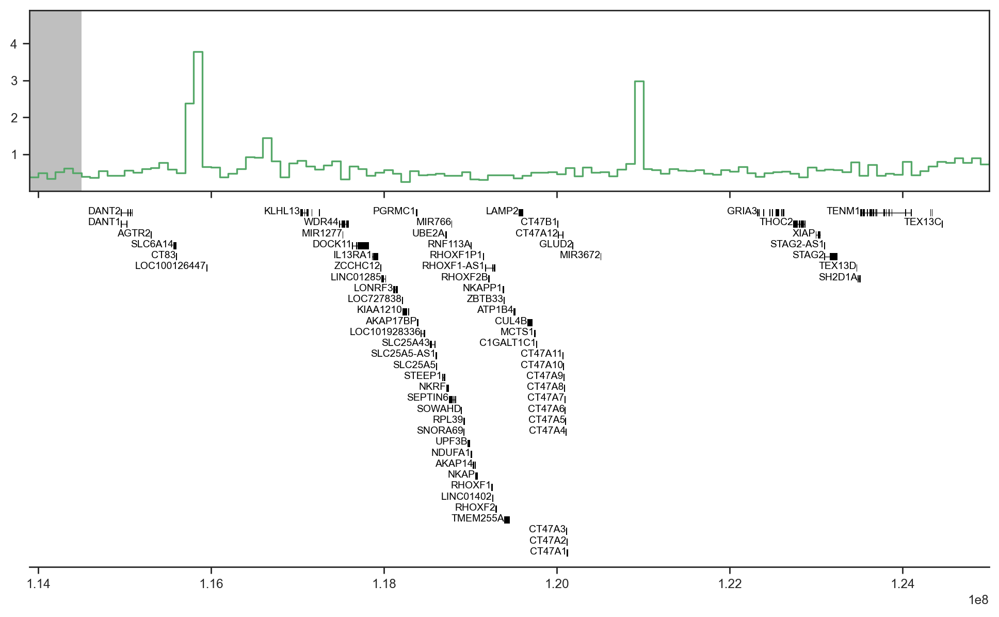

In [59]:
ax = gi.gene_plot('chrX', 115000000, 125000000, assembly='hg19', figsize=(12, 7), aspect=2)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2') ;
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

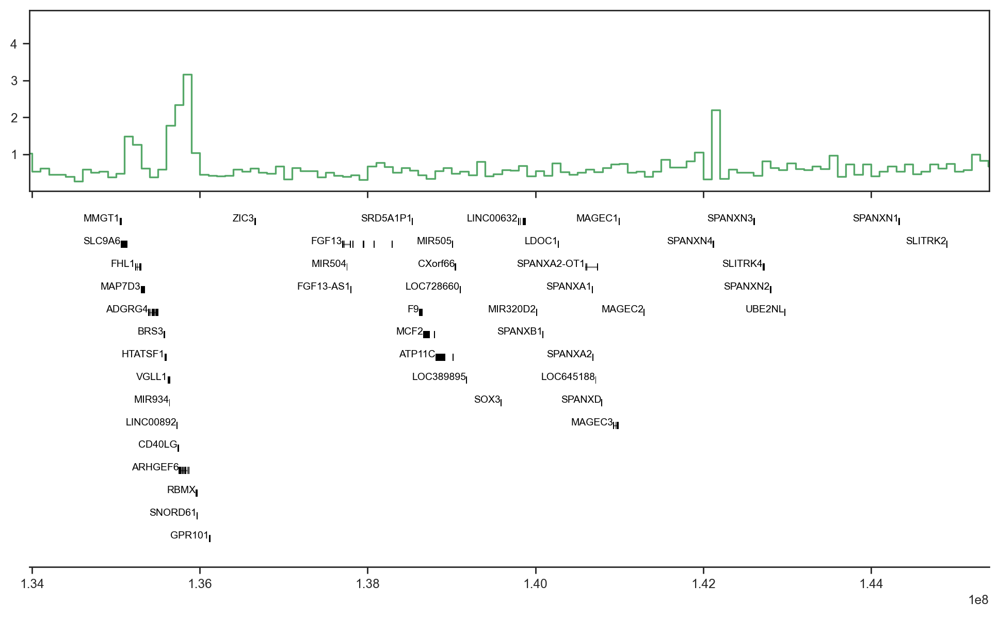

In [60]:
ax = gi.gene_plot('chrX', 135000000, 145000000, assembly='hg19', figsize=(12, 7), aspect=2)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2') ;
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

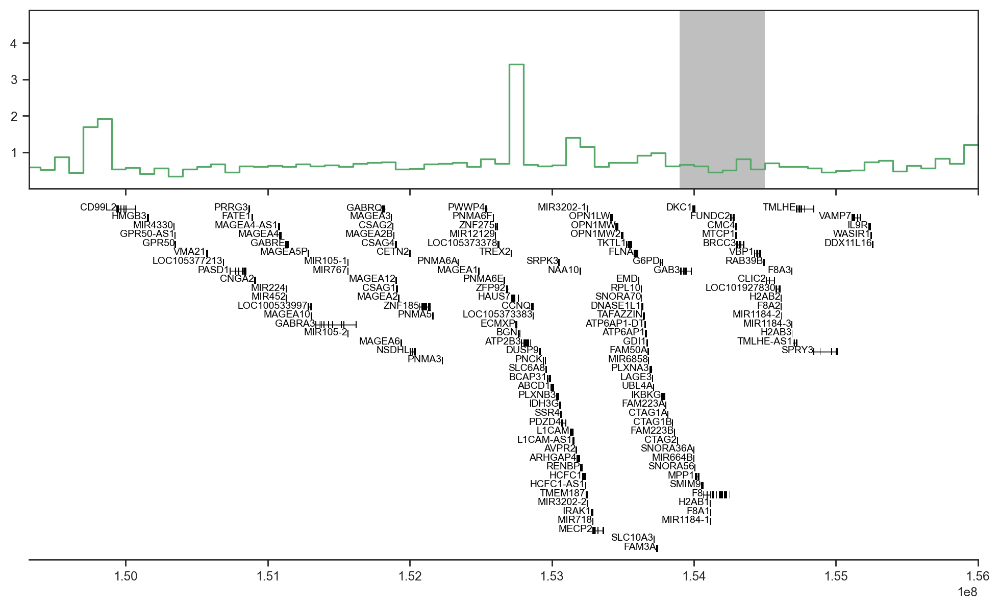

In [61]:
ax = gi.gene_plot('chrX', 150000000, 156000000, assembly='hg19', figsize=(12, 7), aspect=2)
ax.plot(plot_df.pos, plot_df.propils_znorm, color='C2') ;
for tup in extended_peak_regions_75.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax)

## Mean of absolute skew z norm

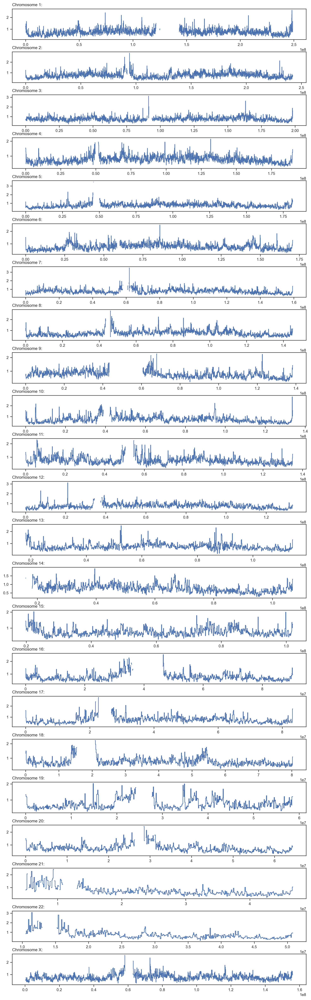

In [9]:
def absmean(sr):
    return np.absolute(sr).mean()

fig, ax = plt.subplots(23, 1, figsize=(12, 40))
for i, chrom in enumerate(chromosomes):
    plot_df = (ils_data
               .loc[(ils_data.chrom == chrom) & ils_data.analysis.isin(analyses_subset)]
               .groupby(['chrom', 'start', 'end'])
               .ilsskew_znorm
               .agg(absmean)
               .reset_index()
               .pipe(stairs)
              )
    ax[i].plot(plot_df.pos, plot_df.ilsskew_znorm)
    ax[i].set_title(f'Chromosome {chrom}:', loc='left')
    plt.subplots_adjust(hspace=0.4)   

## X chromosome

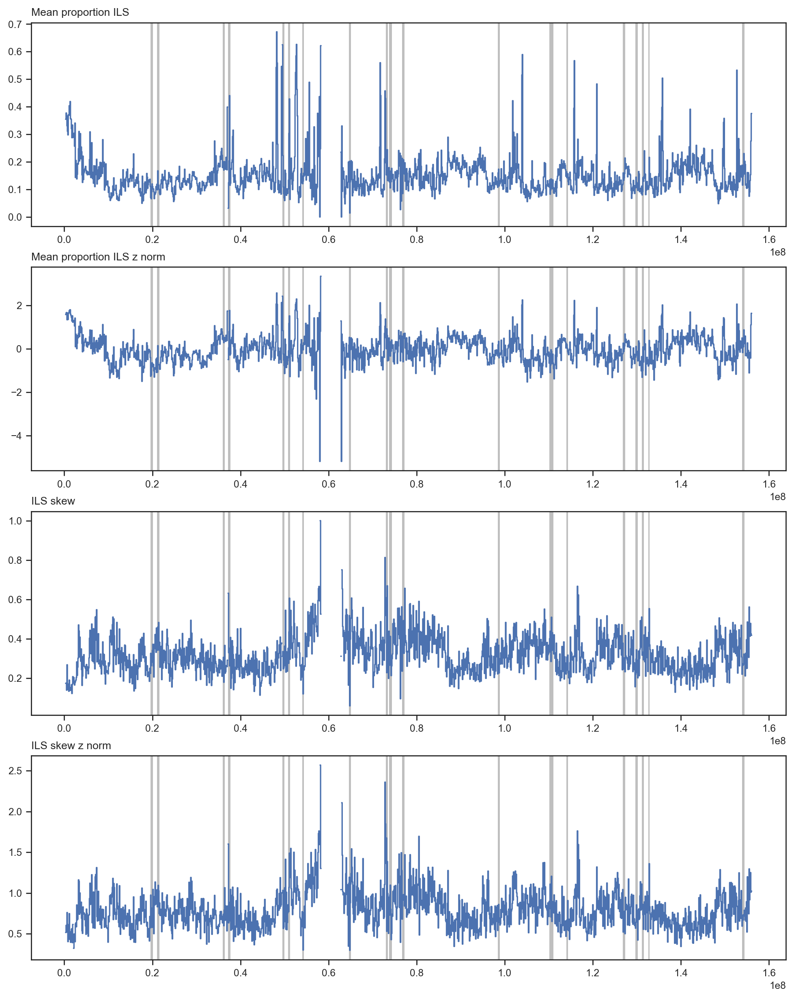

In [27]:
gr = ils_data.loc[(ils_data.chrom == 'X') & ils_data.analysis.isin(analyses_subset)].groupby(['chrom', 'start', 'end'])

fig, ax = plt.subplots(4, 1, figsize=(12, 15))

plot_df = gr.propils.agg('mean').reset_index().pipe(stairs)
ax[0].plot(plot_df.pos, plot_df.propils)
ax[0].set_title('Mean proportion ILS', loc='left')
for tup in extended_peak_regions_90.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[0])
    
plot_df = gr.propils_qnorm.agg('mean').reset_index().pipe(stairs)
ax[1].plot(plot_df.pos, plot_df.propils_qnorm)
ax[1].set_title('Mean proportion ILS q norm', loc='left')
for tup in extended_peak_regions_90.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[1])
    
plot_df = gr.ilsskew.agg(absmean).reset_index().pipe(stairs)
ax[2].plot(plot_df.pos, plot_df.ilsskew)
ax[2].set_title('ILS skew', loc='left')
for tup in extended_peak_regions_90.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[2])

plot_df = gr.ilsskew_znorm.agg(absmean).reset_index().pipe(stairs)
ax[3].plot(plot_df.pos, plot_df.ilsskew_znorm)
ax[3].set_title('ILS skew z norm', loc='left')

for tup in extended_peak_regions_90.itertuples():
    add_band(tup.start_pos, tup.end_pos, ax=ax[3])

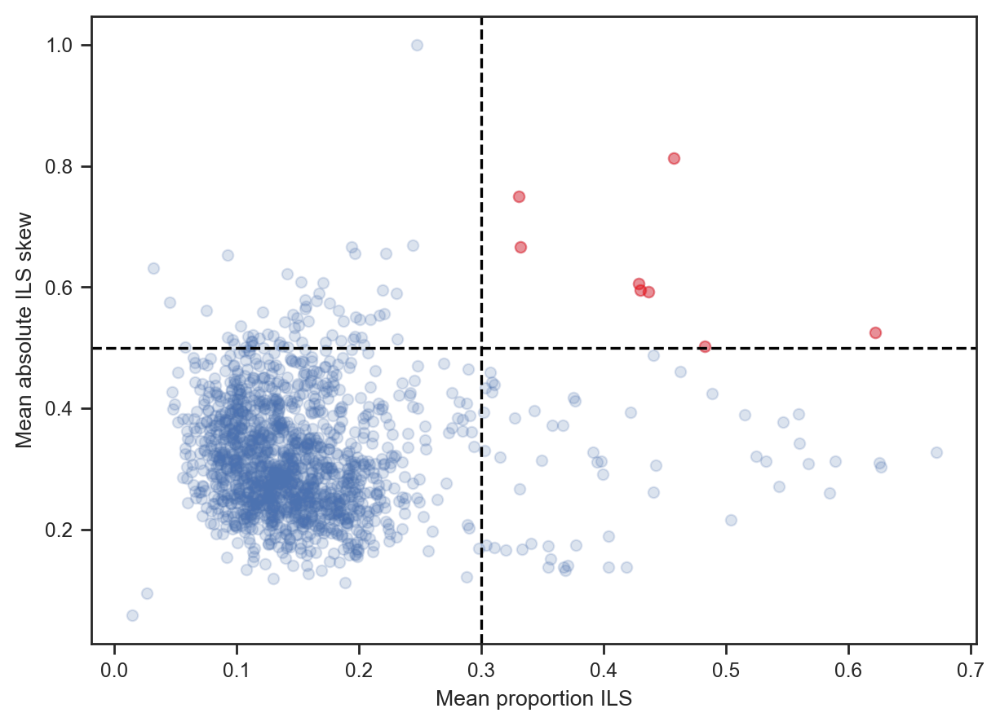

In [54]:
gr = ils_data.loc[(ils_data.chrom == 'X') & ils_data.analysis.isin(analyses_subset)].groupby(['chrom', 'start', 'end'])
plot_df = gr[['start', 'end', 'propils', 'ilsskew']].agg(absmean).reset_index().pipe(stairs)
outliers = (plot_df.propils > 0.3) & (plot_df.ilsskew> 0.5)

plt.figure(figsize=(7, 5))
plt.scatter(plot_df.propils, plot_df.ilsskew, alpha=0.1) ; 
plt.scatter(plot_df.loc[outliers].propils, plot_df.loc[outliers].ilsskew, alpha=0.2, color='red') ; 
plt.axhline(y=0.5, color='black', linestyle='dashed')
plt.axvline(x=0.3, color='black', linestyle='dashed')
plt.xlabel("Mean proportion ILS")
plt.ylabel("Mean absolute ILS skew")
plot_df.loc[outliers, ['chrom', 'start', 'end', 'propils', 'ilsskew']].to_hdf('../results/high_ils_high_skew.h5', 'df')

### Detail of 3 chromosome region

Text(0.0, 1.0, 'ILS skew z-score')

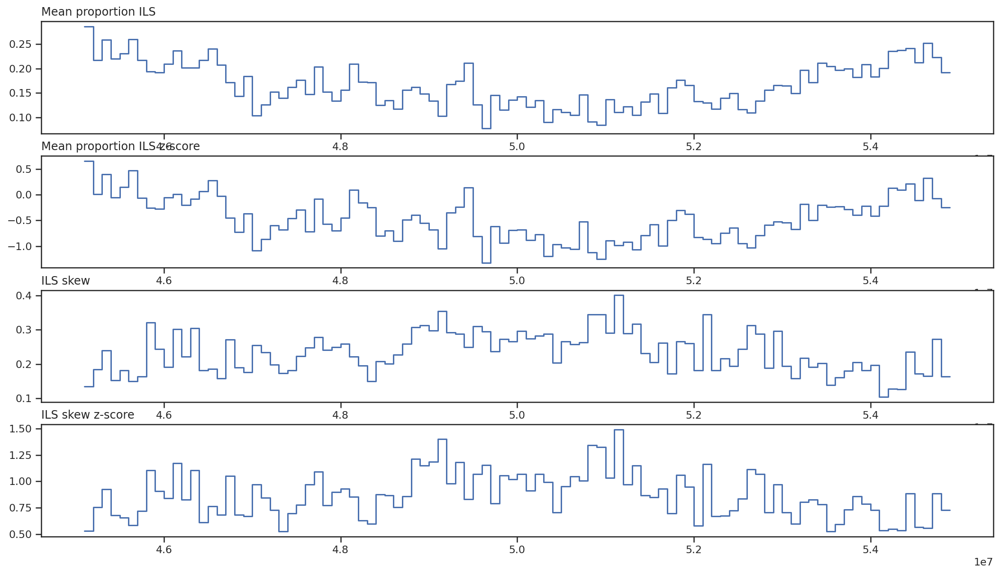

In [14]:
gr = ils_data.loc[(ils_data.chrom == '3') & (ils_data.start > 45e6) & (ils_data.end < 55e6) \
                  & ils_data.analysis.isin(analyses_subset)].groupby(['chrom', 'start', 'end'])

fig, ax = plt.subplots(4, 1, figsize=(12, 10))

plot_df = gr.propils.agg('mean').reset_index().pipe(stairs)
ax[0].plot(plot_df.pos, plot_df.propils)
ax[0].set_title('Mean proportion ILS', loc='left')
    
plot_df = gr.propils_z_score.agg('mean').reset_index().pipe(stairs)
ax[1].plot(plot_df.pos, plot_df.propils_z_score)
ax[1].set_title('Mean proportion ILS z-score', loc='left')
    
plot_df = gr.ilsskew.agg(absmean).reset_index().pipe(stairs)
ax[2].plot(plot_df.pos, plot_df.ilsskew)
ax[2].set_title('ILS skew', loc='left')

plot_df = gr.ilsskew_z_score.agg(absmean).reset_index().pipe(stairs)
ax[3].plot(plot_df.pos, plot_df.ilsskew_z_score)
ax[3].set_title('ILS skew z-score', loc='left')

## Load low ils regions

In [11]:
low_ils_reg = pd.read_csv('../steps/merge_low_data/merged_low_ils_regions.csv').sort_values(by=['start', 'end'])
low_ils_reg.head()

,chrom,analysis,start,end
2534,6,PITPIT_SAGMID_HOMSAP_LEMCAT,200000,900000
1518,18,HYLLAR_MACMUL_SAGMID_LEMCAT,300000,1000000
1586,20,HYLLAR_MACMUL_SAGMID_LEMCAT,300000,1500000
2145,19,LEMCAT_PROSIM_MICMUR_DAUMAD,700000,1400000
1842,9,HYLLAR_MACMUL_SAGMID_LEMCAT,800000,2000000


In [12]:
@window(size=100000, fill='hg38')
def low_ils_total(df):
    return (df.end-df.start).sum()

low_ils_totals = (low_ils_reg
                  .loc[low_ils_reg.analysis.isin(analyses_subset)]
                  .groupby('chrom')
                  .apply(low_ils_total)
                  .reset_index(drop=True, level=-1)
                  .reset_index()
                 )
low_ils_totals.head()

,chrom,start,end,low_ils_total
0,1,0,100000,0
1,1,100000,200000,0
2,1,200000,300000,0
3,1,300000,400000,0
4,1,400000,500000,0


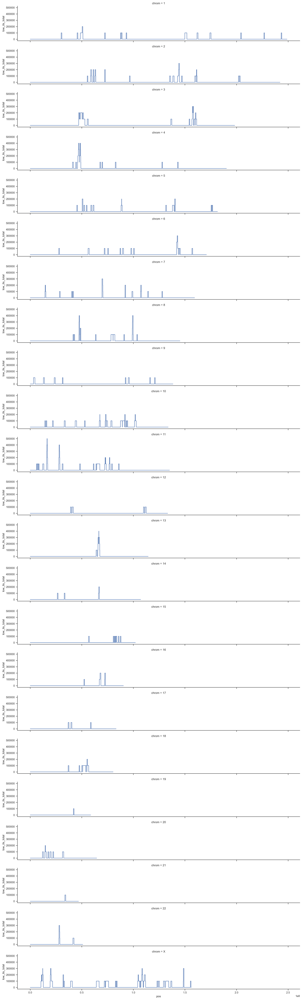

In [13]:
plot_df = stairs(low_ils_totals)
g = sns.FacetGrid(plot_df, row='chrom', height=2, aspect=7, row_order=chromosomes)
g.map(plt.plot,'pos', 'low_ils_total') ;

### Chromosome 3 region detail 

In [ ]:
mg = mygene.MyGeneInfo()
connect_mygene(mg)

In [ ]:
chrom, start, end = 'chr3', 49500000, 50500000
ax = geneplot(chrom, start, end, figsize=(10, 5))

ax.plot(np.linspace(start, end, 1000), np.random.random(1000), 'o') ;

mpld3.display()

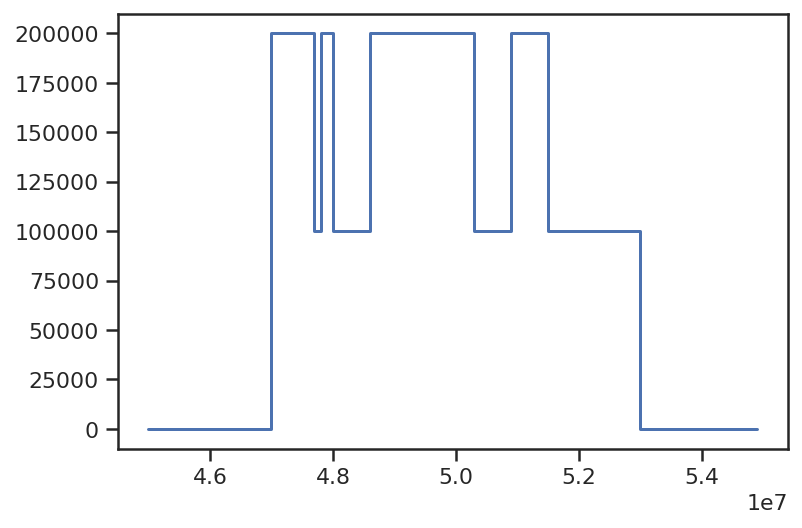

In [88]:
plot_df = stairs(low_ils_totals.loc[lambda df: (df.chrom == '3') &(df.start >= 45e6) & (df.end < 55e6)])
plt.plot(plot_df.pos, plot_df.low_ils_total) ;

### Chromosome X detail 

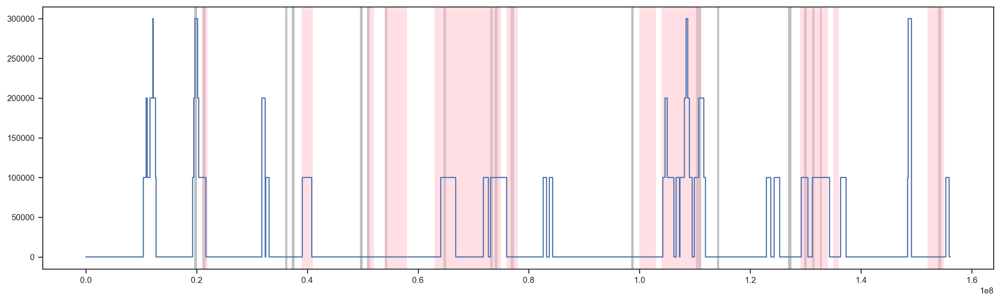

In [57]:
plt.figure(figsize=(18, 5))
plot_df = stairs(low_ils_totals.loc[lambda df: (df.chrom == 'X')])
plt.plot(plot_df.pos, plot_df.low_ils_total)
for tup in extended_peak_regions_90.itertuples():
    add_band(tup.start_pos, tup.end_pos, color='grey')
for tup in human_chimp_low_ils_regions_chrX.itertuples():
    add_band(tup.start, tup.end, color='pink')

In [62]:
plot_df.loc[plot_df.low_ils_total >= 2, ['chrom', 'start', 'end', 'low_ils_total']].to_hdf('../results/low_ils_total.h5', 'df')

In [55]:
pd.read_hdf('../results/high_ils_high_skew.h5')

,chrom,start,end,propils,ilsskew
511,X,51100000,51200000,0.428442,0.606114
511,X,51100000,51200000,0.428442,0.606114
578,X,57800000,57900000,0.331879,0.665734
578,X,57800000,57900000,0.331879,0.665734
579,X,57900000,58000000,0.436988,0.592620
579,X,57900000,58000000,0.436988,0.592620
582,X,58200000,58300000,0.621826,0.524862
582,X,58200000,58300000,0.621826,0.524862
630,X,63000000,63100000,0.330419,0.750287
630,X,63000000,63100000,0.330419,0.750287


In [63]:
pd.read_hdf('../results/low_ils_total.h5')

,chrom,start,end,low_ils_total
28864,X,10400000,10500000,100000
28864,X,10400000,10500000,100000
28865,X,10500000,10600000,100000
28865,X,10500000,10600000,100000
28866,X,10600000,10700000,100000
...,...,...,...,...
30316,X,155600000,155700000,100000
30317,X,155700000,155800000,100000
30317,X,155700000,155800000,100000
30318,X,155800000,155900000,100000


## Gene plots / Enrichment / Heat propagation / GOATOOLS